In [1]:
import numpy as np
import extq
import matplotlib.pyplot as plt
from matplotlib import ticker
import pyemma
import glob
import sys
import importlib
import gc
import sklearn
from sklearn import metrics
import ivac
import seaborn as sns

In [2]:
sys.path.insert(1, "../../python")
sys.path.insert(1, "../../..")
import util
import kde

In [3]:
plt.style.use("seaborn-ticks")
sns.set_palette("colorblind")

# Load feature 2 data (salt bridges)

In [4]:
with np.load("../../data/raw_feat/feat2_raw.npz", allow_pickle=True) as f:
    data = f["arr_0"]

In [5]:
print(len(data))
print(data[0].shape)

1295
(3000, 60)


In [6]:
data_arr = np.concatenate(data)
print(data_arr.shape)

(6580000, 60)


## load CVs 

In [7]:
with np.load("../../data/raw_feat/cv_dist_spin.npz", allow_pickle=True) as f:
    cv_arr = f["arr_0"]

In [8]:
traj_lens = [len(traj) for traj in data]
traj_inds = []
subtot = 0
for length in traj_lens[:-1]:
    subtot += length
    traj_inds.append(subtot)
cv_trajs = np.split(cv_arr, traj_inds)

In [9]:
cv_arr.shape

(6580000, 2)

In [10]:
# take only last 30 features (Cz - Cd distances)
data_cz = [traj[:, 30:] for traj in data]

## Models 

In [10]:
feat2_models = np.load("../../data/models_feat2.npy")

In [11]:
models_cz = feat2_models[:, 30:]

## Load IVAC data

Load New version using Gaussian contact-transformed distances (4.26.21)

In [12]:
livac_trajs = np.load("../../data/sb-livac-gauss.npy", allow_pickle=True)
print(livac_trajs.shape)
livac_arr = np.concatenate(livac_trajs)
print(livac_arr.shape)
models_livac = np.load("../../data/models-livac-gauss.npy")

(1295,)
(6580000, 5)


## Load updated IVAC data (clusters)

In [10]:
livac_trajs = np.load("../../data/sb_ind100_TICA/livac_trajs.npy", allow_pickle=True)
livac_arr = np.concatenate(livac_trajs)
models_km100 = np.load("../../data/sb_ind100_TICA/models.npy", allow_pickle=True)

# New states rd 2 (4.26.21) 

In [13]:
dist = cv_arr[:, 0]
rot = cv_arr[:, 1]
tic1 = livac_arr[:, 1]

# ellipse centered at (-8.919, -109.9) with radii 0.632 and 9.8 (1 sigma in each direction) for down- state
# take points where TIC 1 < -1
dist_ax_down = (dist + 8.919) / 0.632
rot_ax_down = (rot + 109.9) / 9.8
downmin_ids = (((dist_ax_down ** 2 + rot_ax_down ** 2) < 1) & (tic1 < -1.0)).nonzero()[
    0
]

# ellipse centered at (4.535, 43.7) with radii 0.632 and 2.9 for up+ state
# take points where TIC 1 > 1.1
dist_ax_upp = (dist - 4.535) / 0.632
rot_ax_upp = (rot - 43.7) / 4.0
upplus_ids = (((dist_ax_upp ** 2 + rot_ax_upp ** 2) < 1) & (tic1 > 1.2)).nonzero()[0]

In [14]:
mask = np.ones(len(cv_arr), dtype=bool)
mask[downmin_ids] = False
mask[upplus_ids] = False

# len(**_ids) is number of points in each state
downmin = data_arr[downmin_ids]
upplus = data_arr[upplus_ids]
other = data_arr[mask]

# split CV data
downmin_cvs = cv_arr[downmin_ids]
upplus_cvs = cv_arr[upplus_ids]
other_cvs = cv_arr[mask]

In [15]:
assert (len(downmin) + len(upplus) + len(other)) == len(cv_arr)
print(f"Number of down- structures:  {len(downmin)}")
print(f"Number of up+ structures:   {len(upplus)}")
print(f"Number of other structures: {len(other)}")

Number of down- structures:  1355
Number of up+ structures:   53027
Number of other structures: 6525618


## plot new states 

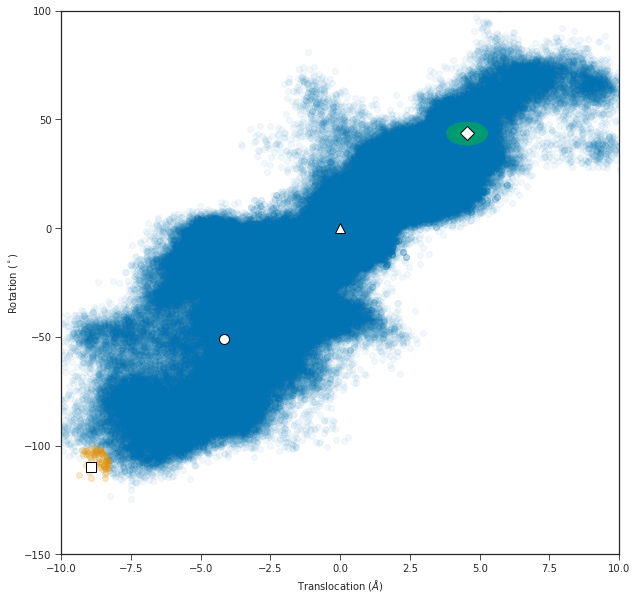

In [17]:
f, ax = plt.subplots(figsize=(10, 10))
ax.scatter(*other_cvs[::20].T, alpha=0.05)
for cv_group in (downmin_cvs, upplus_cvs):
    ax.scatter(*cv_group[::20].T, alpha=0.2)
util.format_cvs(ax)

In [18]:
downmin_livac = livac_arr[downmin_ids]
upplus_livac = livac_arr[upplus_ids]
other_livac = livac_arr[mask]

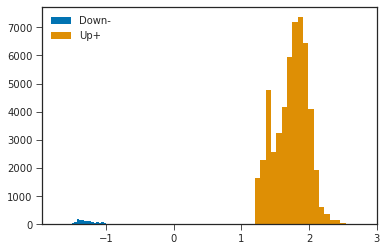

In [19]:
plt.hist(downmin_livac[:, 1], bins=20)
plt.hist(upplus_livac[:, 1], bins=20)
plt.legend(['Down-', "Up+"])plt.hist(downmin_livac[:, 1], bins=20)
plt.hist(upplus_livac[:, 1], bins=20)
plt.legend(['Down-', "Up+"])


Text(0.5, 0, 'Rotation')

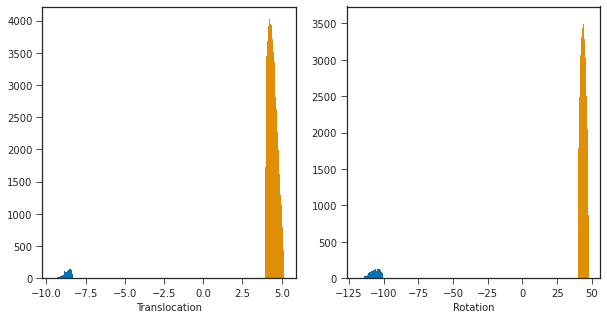

In [20]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
ax1.hist(downmin_cvs[:, 0], bins=20)
ax1.hist(upplus_cvs[:, 0], bins=20)
ax1.set_xlabel("Translocation")
ax2.hist(downmin_cvs[:, 1], bins=20)
ax2.hist(upplus_cvs[:, 1], bins=20)
ax2.set_xlabel("Rotation")

In [21]:
%matplotlib widget

In [23]:
f, ax = plt.subplots(figsize=(10, 10), subplot_kw={"projection": "3d"})
ax.scatter(other_cvs[::20, 0], other_cvs[::20, 1], other_livac[::20, 1], alpha=0.05)
for cv_group, state in zip((downmin_cvs, upplus_cvs), (downmin_livac, upplus_livac)):
    ax.scatter(cv_group[::10, 0], cv_group[::10, 1], state[::10, 1], alpha=0.3)
ax.legend(["Other", "Down-", "Up+"])
ax.set_xlim([-10, 10])
ax.set_ylim([-150, 150])
ax.set_xlabel("Translocation")
ax.set_ylabel("Rotation")
ax.set_zlabel(f"iTIC {1}")

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

Text(0.5, 0, 'iTIC 1')

# Distances 

In [24]:
%matplotlib inline

In [25]:
print(sklearn.get_config()["working_memory"])

1024


In [26]:
# compute minimum distance (minimum of column) from domain to dimeric/monomeric state
def reduce_func(D_chunk, start):
    min2 = np.min(D_chunk, axis=1)
    return min2

In [27]:
d_downmin = []
counter = 0.0
tot = len(data_arr)
skip = 1

for chunk in metrics.pairwise_distances_chunked(
    data_arr, downmin[::skip], n_jobs=-1, reduce_func=reduce_func
):
    d_downmin.append(chunk)
    counter += float(len(chunk))
    perc = counter / tot * 100
    print(f"{perc:.2f}% completed")

1.51% completed
3.01% completed
4.52% completed
6.02% completed
7.53% completed
9.03% completed
10.54% completed
12.04% completed
13.55% completed
15.05% completed
16.56% completed
18.06% completed
19.57% completed
21.08% completed
22.58% completed
24.09% completed
25.59% completed
27.10% completed
28.60% completed
30.11% completed
31.61% completed
33.12% completed
34.62% completed
36.13% completed
37.63% completed
39.14% completed
40.64% completed
42.15% completed
43.66% completed
45.16% completed
46.67% completed
48.17% completed
49.68% completed
51.18% completed
52.69% completed
54.19% completed
55.70% completed
57.20% completed
58.71% completed
60.21% completed
61.72% completed
63.23% completed
64.73% completed
66.24% completed
67.74% completed
69.25% completed
70.75% completed
72.26% completed
73.76% completed
75.27% completed
76.77% completed
78.28% completed
79.78% completed
81.29% completed
82.80% completed
84.30% completed
85.81% completed
87.31% completed
88.82% completed
90.

In [28]:
print(len(d_downmin), d_downmin[0].shape)

# Set all distances of point in monomer state to be 0 explicitly
d_downmin_arr = np.reshape(np.concatenate(d_downmin), (-1, 1))
print(d_downmin_arr.shape)
print(np.max(d_downmin_arr[downmin_ids]))
d_downmin_arr[downmin_ids] = 0
print(np.max(d_downmin_arr[downmin_ids]))

print(d_downmin_arr.shape)

67 (99053,)
(6580000, 1)
5.840039e-07
0.0
(6580000, 1)


In [29]:
np.save("../../data/dist_downmin_dduu_feat2_TIC", d_downmin_arr)

## Up+state

In [31]:
d_upp = []
counter = 0.0
skip = 3

for chunk in metrics.pairwise_distances_chunked(
    data_arr, upplus[::skip], n_jobs=20, reduce_func=reduce_func
):
    d_upp.append(chunk)
    counter += float(len(chunk))
    perc = counter / tot * 100
    print(f"{perc:.2f}% completed")

0.12% completed
0.23% completed
0.35% completed
0.46% completed
0.58% completed
0.69% completed
0.81% completed
0.92% completed
1.04% completed
1.15% completed
1.27% completed
1.38% completed
1.50% completed
1.62% completed
1.73% completed
1.85% completed
1.96% completed
2.08% completed
2.19% completed
2.31% completed
2.42% completed
2.54% completed
2.65% completed
2.77% completed
2.88% completed
3.00% completed
3.12% completed
3.23% completed
3.35% completed
3.46% completed
3.58% completed
3.69% completed
3.81% completed
3.92% completed
4.04% completed
4.15% completed
4.27% completed
4.39% completed
4.50% completed
4.62% completed
4.73% completed
4.85% completed
4.96% completed
5.08% completed
5.19% completed
5.31% completed
5.42% completed
5.54% completed
5.65% completed
5.77% completed
5.89% completed
6.00% completed
6.12% completed
6.23% completed
6.35% completed
6.46% completed
6.58% completed
6.69% completed
6.81% completed
6.92% completed
7.04% completed
7.15% completed
7.27% co

In [33]:
print(len(d_upp), d_upp[0].shape)

# Set all distances of point in monomer state to be 0 explicitly
d_upp_arr = np.reshape(np.concatenate(d_upp), (-1, 1))
print(d_upp_arr.shape)
print(np.max(d_upp_arr[upplus_ids]))
d_upp_arr[upplus_ids] = 0
print(np.max(d_upp_arr[upplus_ids]))

print(d_upp_arr.shape)

867 (7593,)
(6580000, 1)
1.0302067
0.0
(6580000, 1)


In [34]:
np.save("../../data/dist_upp_dduu_feat2_TIC.npy", d_upp_arr)

# Smoothing and guess functions 

In [37]:
# make smoothing function
smooth = (d_downmin_arr * d_upp_arr) ** 0.5 / (d_downmin_arr + d_upp_arr)

# make guess
guess_downmin = (d_upp_arr / (d_downmin_arr + d_upp_arr)) ** 2
guess_upp = (d_downmin_arr / (d_downmin_arr + d_upp_arr)) ** 2

# make smoothing 0 at boundaries (dimer and monomer states)
smooth[(mask == 0).flatten()] = 0
# ensure homogeneous boundary conditions for guess
guess_upp[upplus_ids] = 1
guess_upp[downmin_ids] = 0
guess_downmin[downmin_ids] = 1
guess_downmin[upplus_ids] = 0

In [39]:
print(smooth.shape, guess_downmin.shape, guess_upp.shape)

(6580000, 1) (6580000, 1) (6580000, 1)


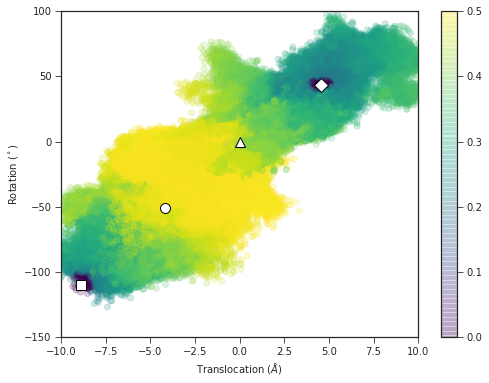

In [40]:
# Plot smoothing function
fig, ax = plt.subplots(figsize=(8, 6))
h = ax.scatter(
    cv_arr[::10, 0], cv_arr[::10, 1], c=smooth[::10], alpha=0.2, cmap="viridis"
)
plt.colorbar(h, ax=ax)
util.format_cvs(ax)

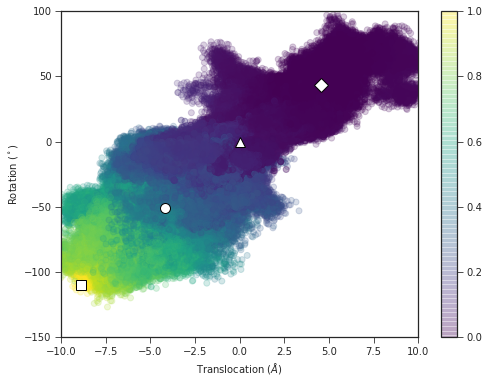

In [41]:
# Plot down state guess function
fig, ax = plt.subplots(figsize=(8, 6))
h = ax.scatter(
    cv_arr[::10, 0], cv_arr[::10, 1], c=guess_downmin[::10], alpha=0.2, cmap="viridis"
)
plt.colorbar(h, ax=ax)
util.format_cvs(ax)

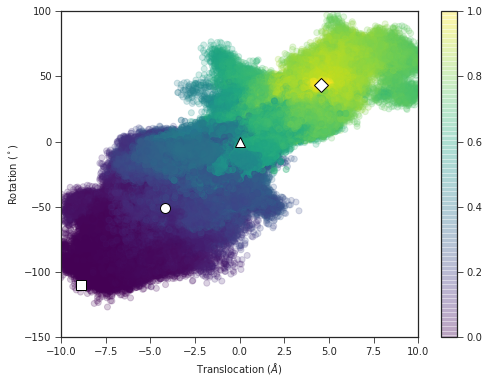

In [42]:
# Plot up+ state guess function
fig, ax = plt.subplots(figsize=(8, 6))
h = ax.scatter(
    cv_arr[::10, 0], cv_arr[::10, 1], c=guess_upp[::10], alpha=0.2, cmap="viridis"
)
plt.colorbar(h, ax=ax)
util.format_cvs(ax)

## Construct bases

In [43]:
basis_smooth = smooth * data_arr
print(basis_smooth.shape)
basis_white, L = util.svd_whiten(basis_smooth, 1, frac_retain=0.75)
basis_white[(mask == 0).flatten()] = 0

(6580000, 60)


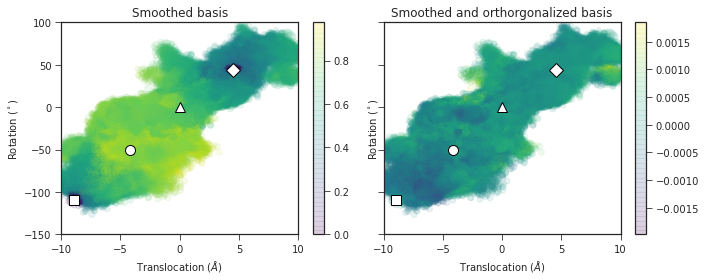

In [44]:
# plot bases
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4), sharex=True, sharey=True)
h1 = ax1.scatter(
    cv_arr[::10, 0],
    cv_arr[::10, 1],
    c=np.mean(basis_smooth[::10, :], axis=1),
    alpha=0.1,
    cmap="viridis",
)
h2 = ax2.scatter(
    cv_arr[::10, 0],
    cv_arr[::10, 1],
    c=np.mean(basis_white[::10, :], axis=1),
    alpha=0.1,
    cmap="viridis",
)
for ax in (ax1, ax2):
    util.format_cvs(ax)
ax1.set_title("Smoothed basis")
ax2.set_title("Smoothed and orthorgonalized basis")
plt.colorbar(h1, ax=ax1)
plt.colorbar(h2, ax=ax2)
f.tight_layout()

In [46]:
np.save("../../data/basis_white_dduu_feat2_TICA.npy", basis_white)
np.save("../../data/guess_down_dduu_feat2_TICA.npy", guess_downmin)
np.save("../../data/guess_up_dduu_feat2_TICA.npy", guess_upp)

## Convert to lists of np arrays 

In [47]:
const = np.ones((len(data_arr), 1))
basisL_arr = np.hstack((const, data_arr))
basisF_arr = basis_white

# basisL = np.split(basisL_arr, traj_inds)
basisL = np.split(data_arr, traj_inds)
basisF = np.split(basisF_arr, traj_inds)
guessU = np.split(np.squeeze(guess_upp), traj_inds)
guessD = np.split(np.squeeze(guess_downmin), traj_inds)

print(len(basisL), basisL[0].shape)
print(len(basisF), basisF[0].shape)
print(len(guessU))
print(len(guessD))

1295 (3000, 60)
1295 (3000, 2)
1295
1295


Define lags 

In [48]:
# unit is 0.1 ps, up to 100 ns
lags = [1, 2, 5, 10, 20, 30, 40, 50, 100, 200, 300, 400, 500, 1000]

In [49]:
weights = np.load("../../data/feat2_local_duu/coms_feat2.npy", allow_pickle=True)

# Committors 

In [50]:
in_domain = np.split(mask, traj_inds)
q_downup, qb_downup, q_updown, qb_updown = [], [], [], []
for (lag, com) in zip(lags, weights):
    print(f"Calculating committors for lag {lag}")
    q_downup.append(extq.dga.forward_committor(basisF, com, in_domain, guessU, lag))
    qb_downup.append(extq.dga.backward_committor(basisF, com, in_domain, guessD, lag))
    q_updown.append(extq.dga.forward_committor(basisF, com, in_domain, guessD, lag))
    qb_updown.append(extq.dga.backward_committor(basisF, com, in_domain, guessU, lag))

Calculating committors for lag 1
Calculating committors for lag 2
Calculating committors for lag 5
Calculating committors for lag 10
Calculating committors for lag 20
Calculating committors for lag 30
Calculating committors for lag 40
Calculating committors for lag 50
Calculating committors for lag 100
Calculating committors for lag 200
Calculating committors for lag 300
Calculating committors for lag 400
Calculating committors for lag 500
Calculating committors for lag 1000


In [51]:
np.save("../../data/feat2_dduu_TICA/q_du_feat2_TICA.npy", q_downup)
np.save("../../data/feat2_dduu_TICA/qb_du_feat2_TICA.npy", qb_downup)
np.save("../../data/feat2_dduu_TICA/q_ud_feat2_TICA.npy", q_updown)
np.save("../../data/feat2_dduu_TICA/qb_ud_feat2_TICA.npy", qb_updown)

/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


## Down to up

### Forward committor 

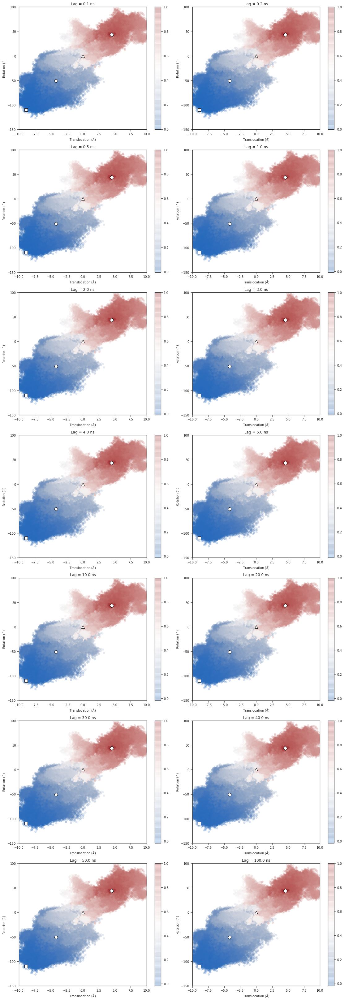

In [52]:
f, axs = plt.subplots(7, 2, figsize=(16, 45))
for lag, q, ax in zip(lags, q_downup, axs.flatten()):
    q_arr = np.concatenate(q)
    h = ax.scatf, axs = plt.subplots(7, 2, figsize=(16, 45))
for lag, q, ax in zip(lags, q_downup, axs.flatten()):
    q_arr = np.concatenate(q)
    h = ax.scatter(cv_arr[::10, 0], cv_arr[::10, 1], 
                   c=q_arr[::10], 
                   cmap='vlag', 
                   alpha=0.2)
    plt.colorbar(h, ax=ax)
    ax.set_title(f'Lag = {lag * 0.1} ns')
    util.format_cvs(ax)
    
f.tight_layout()ter(cv_arr[::10, 0], cv_arr[::10, 1], 
                   c=q_arr[::10], 
                   cmap='vlag', 
                   alpha=0.2)
    plt.colorbar(h, ax=ax)
    ax.set_title(f'Lag = {lag * 0.1} ns')
    util.format_cvs(ax)
    
f.tight_layout()

Text(0.5, 0, 'iTIC 1')

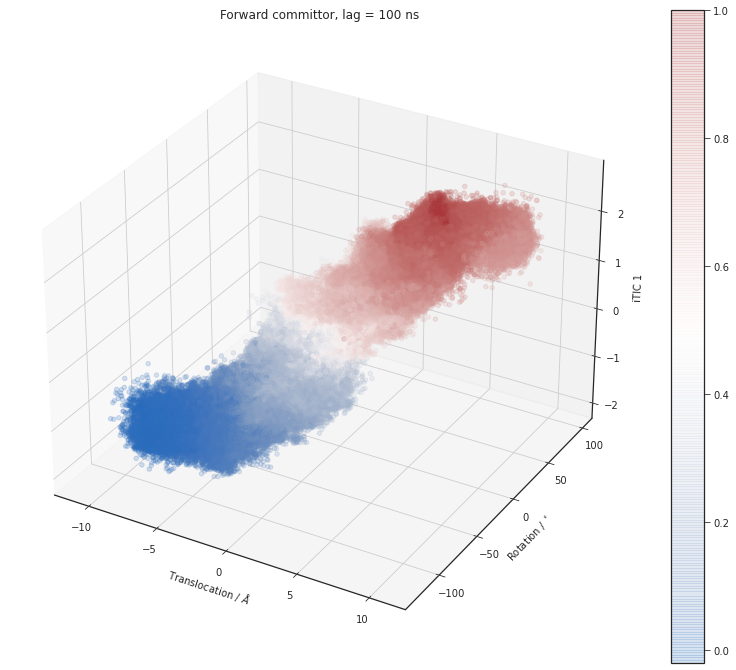

In [53]:
# projection with TIC
f, ax = plt.subplots(figsize=(14, 12), subplot_kw={"projection": "3d"})
q = np.concatenate(q_downup[-1])
h = ax.scatter(
    cv_arr[::10, 0],
    cv_arr[::10, 1],
    livac_arr[::10, 1],
    c=q[::10],
    cmap="vlag",
    alpha=0.2,
)
plt.colorbar(h, ax=ax)
ax.set_title("Forward committor, lag = 100 ns")
ax.set_xlabel("Translocation / $\AA$")
ax.set_ylabel("Rotation / $^\circ$")
ax.set_zlabel("iTIC 1")

In [56]:
# points closest to transition state
# 100 ns lag time
q = np.concatenate(q_downup[-1])
args = ((q - 0.5) ** 2).argsort()
print(args[:10])

[5049058 5060043 5056496 5063580 5049435 2713199  286707 5032521 2503384
 2784588]


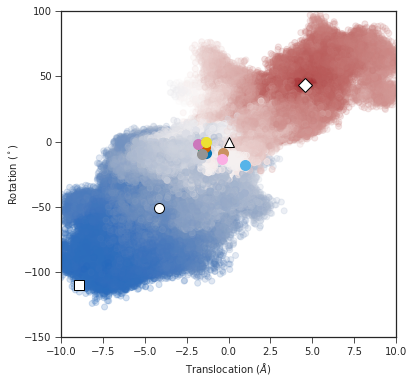

In [57]:
f, ax = plt.subplots(figsize=(6, 6))
ax.scatter(cv_arr[::10, 0], cv_arr[::10, 1], c=q[::10], cmap="vlag", alpha=0.2)
for idx in args[:10]:
    ax.plot(cv_arr[idx, 0], cv_arr[idx, 1], "o", ms=10)
util.format_cvs(ax)

In [58]:
util.frame(5049058)

(1181, 59058)

### Backward committor

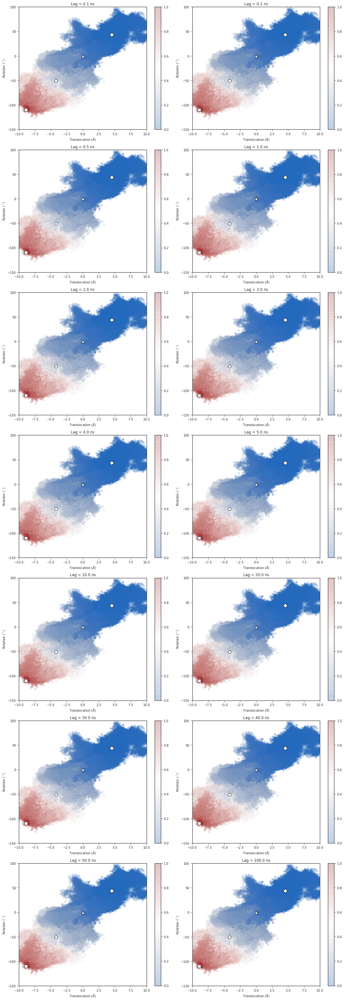

In [59]:
f, axs = plt.subplots(7, 2, figsize=(16, 45))
for lag, q, ax in zip(lags, qb_downup, axs.flatten()):
    q_arr = np.concatenate(q)
    h = ax.scatter(
        cv_arr[::10, 0], cv_arr[::10, 1], c=q_arr[::10], cmap="vlag", alpha=0.2
    )
    plt.colorbar(h, ax=ax)
    ax.set_title(f"Lag = {lag * 0.1} ns")
    util.format_cvs(ax)

f.tight_layout()

## Up to Down

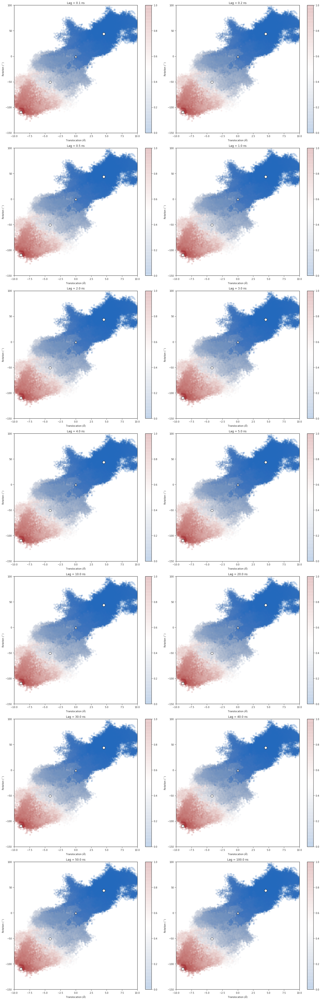

In [54]:
f, axs = plt.subplots(7, 2, figsize=(20, 60))
for lag, q, ax in zip(lags, q_updown, axs.flatten()):
    q_arr = np.concatenate(q)
    h = ax.scatter(
        cv_arr[::10, 0], cv_arr[::10, 1], c=q_arr[::10], cmap="vlag", alpha=0.2
    )
    plt.colorbar(h, ax=ax)
    ax.set_title(f"Lag = {lag * 0.1} ns")
    util.format_cvs(ax)

f.tight_layout()

Text(0.5, 0, 'iTIC 1')

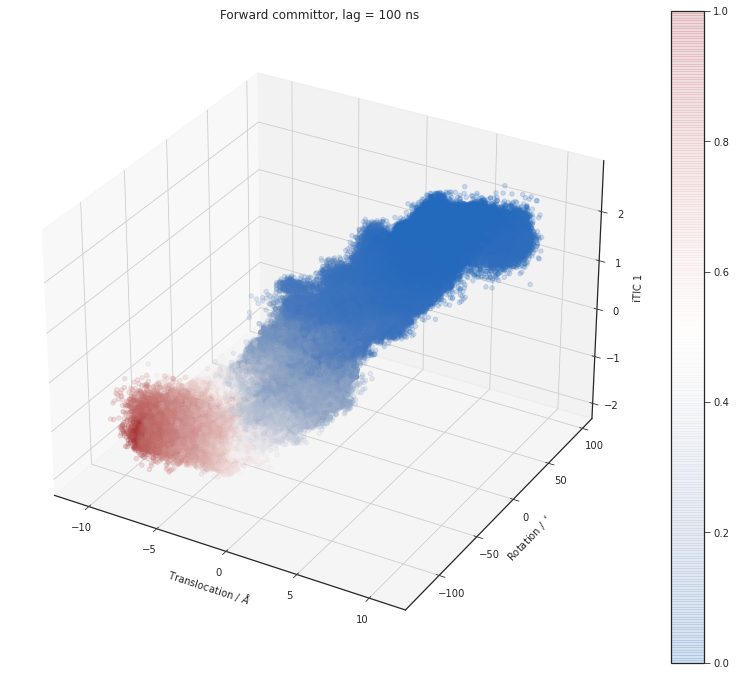

In [55]:
# projection with TIC
f, ax = plt.subplots(figsize=(14, 12), subplot_kw={"projection": "3d"})
q = np.concatenate(q_updown[-1])
h = ax.scatter(
    cv_arr[::10, 0],
    cv_arr[::10, 1],
    livac_arr[::10, 1],
    c=q[::10],
    cmap="vlag",
    alpha=0.2,
)
plt.colorbar(h, ax=ax)
ax.set_title("Forward committor, lag = 100 ns")
ax.set_xlabel("Translocation / $\AA$")
ax.set_ylabel("Rotation / $^\circ$")
ax.set_zlabel("iTIC 1")